<a href="https://colab.research.google.com/github/Haadi-kp/Image_Colourization/blob/main/Colab_Notebooks/Unet_with_pretrained_generator_02_03_25.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import glob
import time
import numpy as np
from PIL import Image
from pathlib import Path
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

import torch
from torch import nn, optim
from torchvision import transforms
from torchvision.utils import make_grid
from torch.utils.data import Dataset, DataLoader
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
from fastai.data.external import untar_data, URLs
from fastai.vision.learner import create_body
from torchvision.models.resnet import resnet18
from fastai.vision.models.unet import DynamicUnet
!pip install torchsummary
from torchsummary import summary
!pip install fastai==2.4


  Using cached fastai-2.4-py3-none-any.whl.metadata (9.8 kB)
  Using cached fastcore-1.3.29-py3-none-any.whl.metadata (16 kB)
INFO: pip is looking at multiple versions of fastai to determine which version is compatible with other requirements. This could take a while.
ERROR: Could not find a version that satisfies the requirement torch<1.10,>=1.7.0 (from fastai) (from versions: 1.13.0, 1.13.1, 2.0.0, 2.0.1, 2.1.0, 2.1.1, 2.1.2, 2.2.0, 2.2.1, 2.2.2, 2.3.0, 2.3.1, 2.4.0, 2.4.1, 2.5.0, 2.5.1, 2.6.0)
ERROR: No matching distribution found for torch<1.10,>=1.7.0


In [ ]:

coco_path = untar_data(URLs.COCO_SAMPLE)
coco_path = str(coco_path) + "/train_sample"
use_colab = True

In [ ]:
if use_colab == True:
    path = coco_path
else:
    path = "Your path to the dataset"

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names
np.random.seed(123)
paths_subset = np.random.choice(paths, 10_000, replace=False) # choosing 1000 images randomly
rand_idxs = np.random.permutation(10_000)
train_idxs = rand_idxs[:8000] # choosing the first 8000 as training set
val_idxs = rand_idxs[8000:] # choosing last 2000 as validation set
train_paths = paths_subset[train_idxs]
val_paths = paths_subset[val_idxs]
print(len(train_paths), len(val_paths))

8000 2000


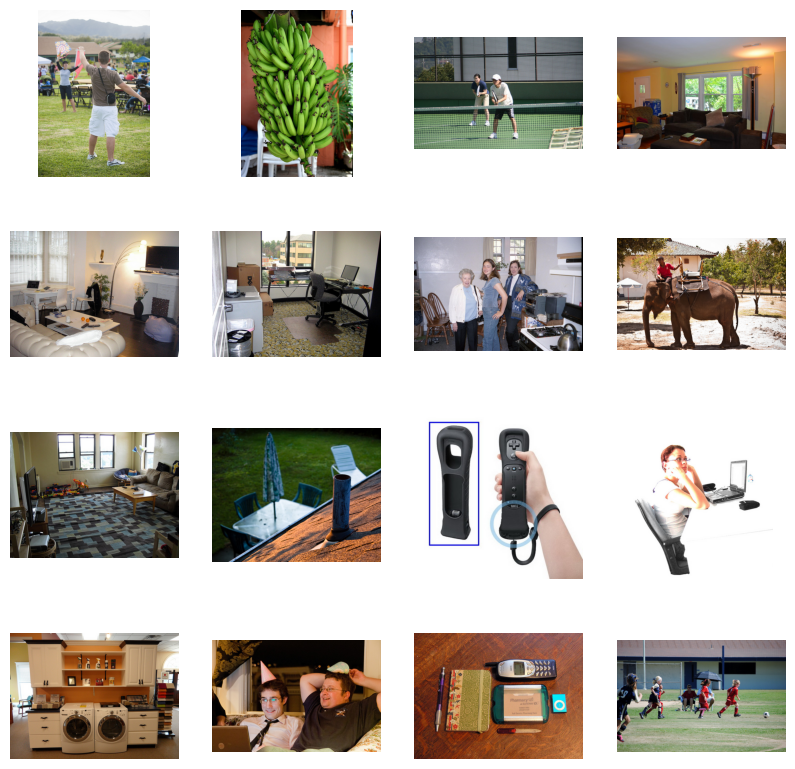

In [ ]:
_, axes = plt.subplots(4, 4, figsize=(10, 10))
for ax, img_path in zip(axes.flatten(), train_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")

In [ ]:
SIZE = 256
class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE),  Image.BICUBIC),
                transforms.RandomHorizontalFlip(), # A little data augmentation!
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE),  Image.BICUBIC)

        self.split = split
        self.size = SIZE
        self.paths = paths

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        img = self.transforms(img)
        img = np.array(img)
        img_lab = rgb2lab(img).astype("float32") # Converting RGB to L*a*b
        img_lab = transforms.ToTensor()(img_lab)
        L = img_lab[[0], ...] / 50. - 1. # Between -1 and 1
        ab = img_lab[[1, 2], ...] / 110. # Between -1 and 1

        return {'L': L, 'ab': ab}

    def __len__(self):
        return len(self.paths)

def make_dataloaders(batch_size=16, n_workers=4, pin_memory=True, **kwargs): # A handy function to make our dataloaders
    dataset = ColorizationDataset(**kwargs)
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory)
    return dataloader

In [ ]:

train_dl = make_dataloaders(paths=train_paths, split='train')
val_dl = make_dataloaders(paths=val_paths, split='val')

data = next(iter(train_dl))
Ls, abs_ = data['L'], data['ab']
print(Ls.shape, abs_.shape)
print(len(train_dl), len(val_dl))

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


torch.Size([16, 1, 256, 256]) torch.Size([16, 2, 256, 256])
500 125


In [ ]:
class UnetBlock(nn.Module):
    def __init__(self, nf, ni, submodule=None, input_c=None, dropout=False,
                 innermost=False, outermost=False):
        super().__init__()
        self.outermost = outermost
        if input_c is None: input_c = nf
        downconv = nn.Conv2d(input_c, ni, kernel_size=4,
                             stride=2, padding=1, bias=False)
        downrelu = nn.LeakyReLU(0.2, True)
        downnorm = nn.BatchNorm2d(ni)
        uprelu = nn.ReLU(True)
        upnorm = nn.BatchNorm2d(nf)

        if outermost:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1)
            down = [downconv]
            up = [uprelu, upconv, nn.Tanh()]
            model = down + [submodule] + up
        elif innermost:
            upconv = nn.ConvTranspose2d(ni, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv]
            up = [uprelu, upconv, upnorm]
            model = down + up
        else:
            upconv = nn.ConvTranspose2d(ni * 2, nf, kernel_size=4,
                                        stride=2, padding=1, bias=False)
            down = [downrelu, downconv, downnorm]
            up = [uprelu, upconv, upnorm]
            if dropout: up += [nn.Dropout(0.5)]
            model = down + [submodule] + up
        self.model = nn.Sequential(*model)

    def forward(self, x):
        if self.outermost:
            return self.model(x)
        else:
            return torch.cat([x, self.model(x)], 1)

class Unet(nn.Module):
    def __init__(self, input_c=1, output_c=2, n_down=8, num_filters=64):
        super().__init__()
        unet_block = UnetBlock(num_filters * 8, num_filters * 8, innermost=True)
        for _ in range(n_down - 5):
            unet_block = UnetBlock(num_filters * 8, num_filters * 8, submodule=unet_block, dropout=True)
        out_filters = num_filters * 8
        for _ in range(3):
            unet_block = UnetBlock(out_filters // 2, out_filters, submodule=unet_block)
            out_filters //= 2
        self.model = UnetBlock(output_c, out_filters, input_c=input_c, submodule=unet_block, outermost=True)

    def forward(self, x):
        return self.model(x)

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        super().__init__()
        model = [self.get_layers(input_c, num_filters, norm=False)]
        model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=1 if i == (n_down-1) else 2)
                          for i in range(n_down)] # the 'if' statement is taking care of not using
                                                  # stride of 2 for the last block in this loop
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                             # activation for the last layer of the model
        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True): # when needing to make some repeatitive blocks of layers,
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]          # it's always helpful to make a separate method for that purpose
        if norm: layers += [nn.BatchNorm2d(nf)]
        if act: layers += [nn.LeakyReLU(0.2, True)]
        return nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)

In [ ]:
PatchDiscriminator(3)

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

In [ ]:
# discriminator = PatchDiscriminator(3)
# dummy_input = torch.randn(16, 3, 256, 256) # batch_size, channels, size, size
# out = discriminator(dummy_input)
# out.shape

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()

    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

In [ ]:
def init_weights(net, init='norm', gain=0.02):

    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, lr_G=2e-4, lr_D=2e-4,
                 beta1=0.5, beta2=0.999, lambda_L1=10.):  # Reduced lambda_L1 from 100 to 10
        super().__init__()
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        if net_G is None:
            self.net_G = init_model(Unet(input_c=1, output_c=2, n_down=8, num_filters=64), self.device)
        else:
            self.net_G = net_G.to(self.device)
        # Enhanced discriminator with deeper architecture
        self.net_D = init_model(PatchDiscriminator(input_c=3, n_down=4, num_filters=128), self.device)
        self.GANcriterion = GANLoss(gan_mode='lsgan').to(self.device)  # Changed to LSGAN
        self.L1criterion = nn.L1Loss()
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        self.L = data['L'].to(self.device)
        self.ab = data['ab'].to(self.device)

    def forward(self):
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image.detach())
        self.loss_D_fake = self.GANcriterion(fake_preds, False)
        real_image = torch.cat([self.L, self.ab], dim=1)
        real_preds = self.net_D(real_image)
        self.loss_D_real = self.GANcriterion(real_preds, True)
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5
        self.loss_D.backward()

    def backward_G(self):
        fake_image = torch.cat([self.L, self.fake_color], dim=1)
        fake_preds = self.net_D(fake_image)
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)
        self.loss_G_L1 = self.L1criterion(self.fake_color, self.ab) * self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()

    def optimize(self):
        self.forward()
        self.net_D.train()
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()
        self.backward_D()
        self.opt_D.step()

        self.net_G.train()
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()
        self.backward_G()
        self.opt_G.step()

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def calculate_psnr(img1, img2):
    """
    Calculate PSNR between two images.
    Args:
        img1: Ground truth image (RGB, range [0, 1]).
        img2: Predicted image (RGB, range [0, 1]).
    Returns:
        PSNR value.
    """
    psnr_value = peak_signal_noise_ratio(img1, img2, data_range=1.0)
    return psnr_value

def calculate_ssim(img1, img2):
    """
    Calculate SSIM between two images.
    Args:
        img1: Ground truth image (RGB, range [0, 1]).
        img2: Predicted image (RGB, range [0, 1]).
    Returns:
        SSIM value.
    """
    # Explicitly set win_size and handle multichannel
    ssim_value = structural_similarity(
        img1, img2, win_size=7, channel_axis=-1, data_range=1.0
    )
    return ssim_value


In [ ]:
class AverageMeter:
    def __init__(self):
        self.reset()

    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3

    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():
    loss_D_fake = AverageMeter()
    loss_D_real = AverageMeter()
    loss_D = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()

    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

def lab_to_rgb(L, ab):
    """
    Takes a batch of images
    """

    L = (L + 1.) * 50.
    ab = ab * 110.
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()
    rgb_imgs = []
    for img in Lab:
        img_rgb = lab2rgb(img)
        rgb_imgs.append(img_rgb)
    return np.stack(rgb_imgs, axis=0)

def visualize_with_metrics(model, data, save=True):
    """
    Visualize the outputs and calculate PSNR and SSIM metrics.
    Args:
        model: Trained model.
        data: A batch of data (L and ab channels).
        save: Whether to save the visualization figure.
    """
    model.net_G.eval()
    with torch.no_grad():
        model.setup_input(data)
        model.forward()
    model.net_G.train()

    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)

    # Calculate PSNR and SSIM for each image in the batch
    psnr_values = []
    ssim_values = []
    for i in range(len(fake_imgs)):
        psnr = calculate_psnr(real_imgs[i], fake_imgs[i])
        ssim = calculate_ssim(real_imgs[i], fake_imgs[i])
        psnr_values.append(psnr)
        ssim_values.append(ssim)

    # Log average PSNR and SSIM for the batch
    avg_psnr = np.mean(psnr_values)
    avg_ssim = np.mean(ssim_values)
    print(f"Avg PSNR: {avg_psnr:.4f}, Avg SSIM: {avg_ssim:.4f}")

    # Plot the visualizations
    fig = plt.figure(figsize=(15, 8))
    for i in range(5):
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    plt.show()

    if save:
        fig.savefig(f"colorization_with_metrics_{time.time()}.png")


def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")

In [ ]:


# Move model to the appropriate device
model = MainModel().to(device)

# Print the model summary
print("Generator Summary:")
summary(model.net_G, input_size=(1, 256, 256))  # Input: Grayscale image (1 channel)

print("\nDiscriminator Summary:")
summary(model.net_D, input_size=(3, 256, 256))  # Input: L and ab combined (3 channels)


model initialized with norm initialization
model initialized with norm initialization
Generator Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,024
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3          [-1, 128, 64, 64]         131,072
       BatchNorm2d-4          [-1, 128, 64, 64]             256
         LeakyReLU-5          [-1, 128, 64, 64]               0
            Conv2d-6          [-1, 256, 32, 32]         524,288
       BatchNorm2d-7          [-1, 256, 32, 32]             512
         LeakyReLU-8          [-1, 256, 32, 32]               0
            Conv2d-9          [-1, 512, 16, 16]       2,097,152
      BatchNorm2d-10          [-1, 512, 16, 16]           1,024
        LeakyReLU-11          [-1, 512, 16, 16]               0
           Conv2d-12            [-1, 512, 8, 8]       4,194,30

In [ ]:
# def pretrain_generator(net_G, train_dl, opt, criterion, epochs):
#     for e in range(epochs):
#         loss_meter = AverageMeter()
#         for data in tqdm(train_dl):
#             L, ab = data['L'].to(device), data['ab'].to(device)
#             preds = net_G(L)
#             loss = criterion(preds, ab)
#             opt.zero_grad()
#             loss.backward()
#             opt.step()
#             loss_meter.update(loss.item(), L.size(0))
#         print(f"Epoch {e + 1}/{epochs}")
#         print(f"L1 Loss: {loss_meter.avg:.5f}")




In [ ]:
# def build_res_unet(n_input=1, n_output=2, size=256):
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#     body = create_body(resnet18(), pretrained=True, n_in=n_input, cut=-2)
#     net_G = DynamicUnet(body, n_output, (size, size)).to(device)
#     return net_G

In [ ]:
# train_dl = make_dataloaders(paths=train_paths, split='train', batch_size=32)  # Increased batch size


In [ ]:
# net_G = build_res_unet(n_input=1, n_output=2, size=256)
# opt = optim.Adam(net_G.parameters(), lr=1e-4)
# criterion = nn.L1Loss()
# pretrain_generator(net_G, train_dl, opt, criterion, 30)

In [ ]:
# save_path = "/content/drive/MyDrive/saved_model/"
# os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist
# model_file_path = os.path.join(save_path, "2:pretrained_generator_model.pth")

# torch.save(net_G, model_file_path)
# print(f"Pretrained generator model saved at: {model_file_path}")

In [ ]:
model_path = "/content/drive/MyDrive/saved_model/2:pretrained_generator_model.pth"

# Load the entire Generator model
net_G = torch.load(model_path, map_location=device)
net_G.eval()  # Set to evaluation mode


<ipython-input-23-61a0ffe0905d>:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  net_G = torch.load(model_path, map_location=device)


DynamicUnet(
  (layers): ModuleList(
    (0): Sequential(
      (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
        (1): BasicBlock(
          (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05

In [ ]:
val_paths_subset = val_paths[:100]  # Take first 100 validation images
fixed_val_dl = make_dataloaders(
    paths=val_paths_subset,
    split='val',
    batch_size=32,  # Keep same batch size as original
    n_workers=4,
    pin_memory=True
)


In [ ]:

def train_model(model, train_dl, val_dl, epochs=30, display_every=200):  # Increased epochs
    torch.backends.cudnn.benchmark = True
    best_psnr = 0.0
    for e in range(epochs):
        loss_meter_dict = create_loss_meters()
        model.train()
        for data in tqdm(train_dl, desc=f"Epoch {e+1}/{epochs}"):
            model.setup_input(data)
            model.optimize()
            update_losses(model, loss_meter_dict, count=data['L'].size(0))

        # Validation phase
        model.eval()
        val_metrics = {'psnr': AverageMeter(), 'ssim': AverageMeter()}
        with torch.no_grad():
            for val_data in tqdm(val_dl, desc="Validation"):
                model.setup_input(val_data)
                model.forward()
                fake_ab = model.fake_color
                real_ab = model.ab

                # Calculate metrics
                fake_rgb = lab_to_rgb(model.L.cpu(), fake_ab.cpu())
                real_rgb = lab_to_rgb(model.L.cpu(), real_ab.cpu())
                for f, r in zip(fake_rgb, real_rgb):
                    psnr = calculate_psnr(r, f)
                    ssim = calculate_ssim(r, f)
                    val_metrics['psnr'].update(psnr)
                    val_metrics['ssim'].update(ssim)

        # Save best model
        current_psnr = val_metrics['psnr'].avg
        if current_psnr > best_psnr:
            best_psnr = current_psnr
            torch.save(model.state_dict(), "/content/drive/MyDrive/saved_model/best_Unet_pretrain_model.pth")

        # Print metrics
        print(f"\nEpoch {e+1} Results:")
        log_results(loss_meter_dict)
        print(f"Validation PSNR: {val_metrics['psnr'].avg:.2f}, SSIM: {val_metrics['ssim'].avg:.4f}")
        visualize_with_metrics(model, next(iter(val_dl)))

In [ ]:
# model_path = "/content/drive/MyDrive/saved_model/2:pretrained_generator_model.pth"

# # Load the entire Generator model
# net_G = torch.load(model_path, map_location=device)
# net_G.eval()  # Set to evaluation mode




model initialized with norm initialization


Epoch 1/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]

<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 6 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 5 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 22 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: 


Epoch 1 Results:
loss_D_fake: 2.42621
loss_D_real: 2.61055
loss_D: 2.51838
loss_G_GAN: 2.77333
loss_G_L1: 0.95691
loss_G: 3.73024
Validation PSNR: 20.64, SSIM: 0.8641
Avg PSNR: 20.3498, Avg SSIM: 0.8651


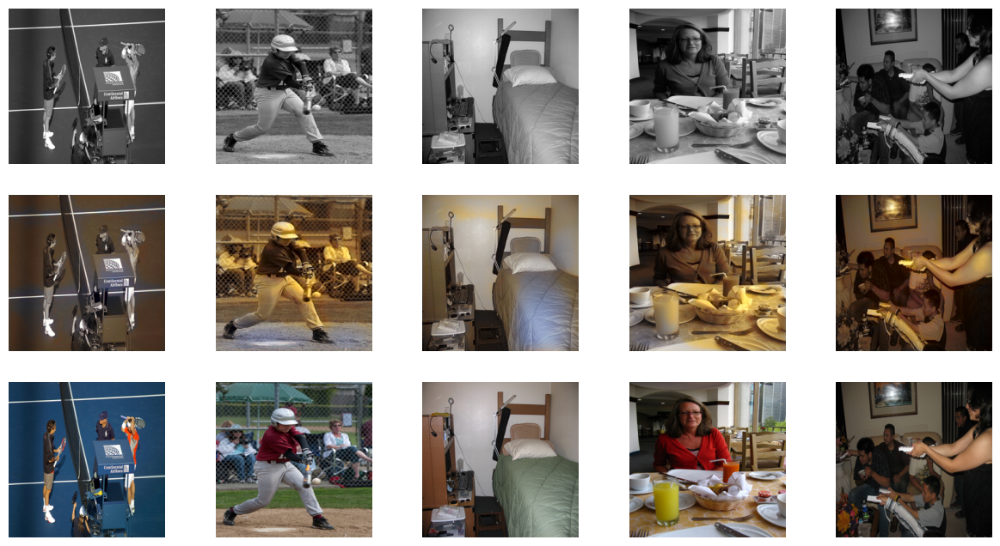

Epoch 2/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 2 Results:
loss_D_fake: 0.53105
loss_D_real: 0.56147
loss_D: 0.54626
loss_G_GAN: 0.69835
loss_G_L1: 0.97870
loss_G: 1.67705
Validation PSNR: 20.42, SSIM: 0.8420
Avg PSNR: 20.4113, Avg SSIM: 0.8571


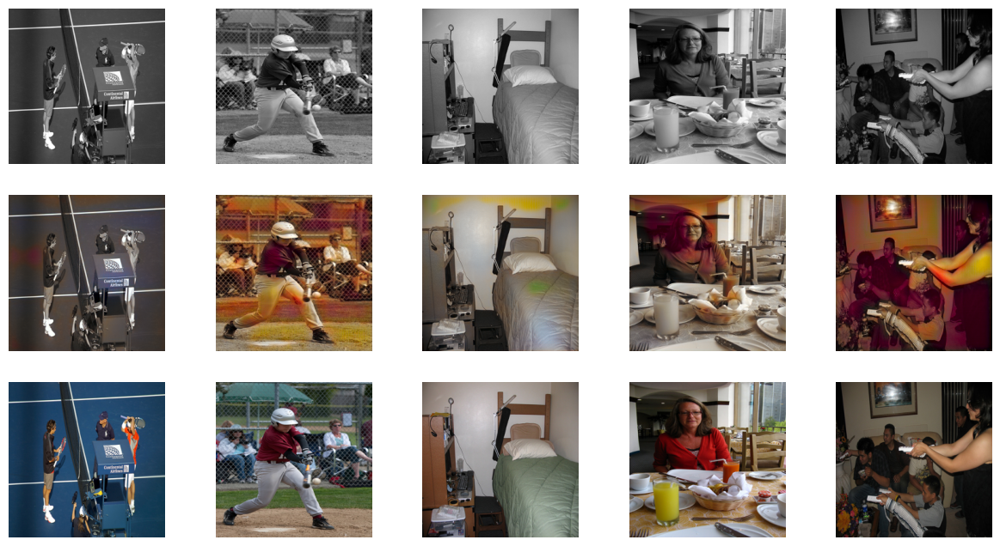

Epoch 3/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 3 Results:
loss_D_fake: 0.47820
loss_D_real: 0.50849
loss_D: 0.49334
loss_G_GAN: 0.64404
loss_G_L1: 1.03171
loss_G: 1.67574
Validation PSNR: 20.42, SSIM: 0.8585
Avg PSNR: 20.3393, Avg SSIM: 0.8620


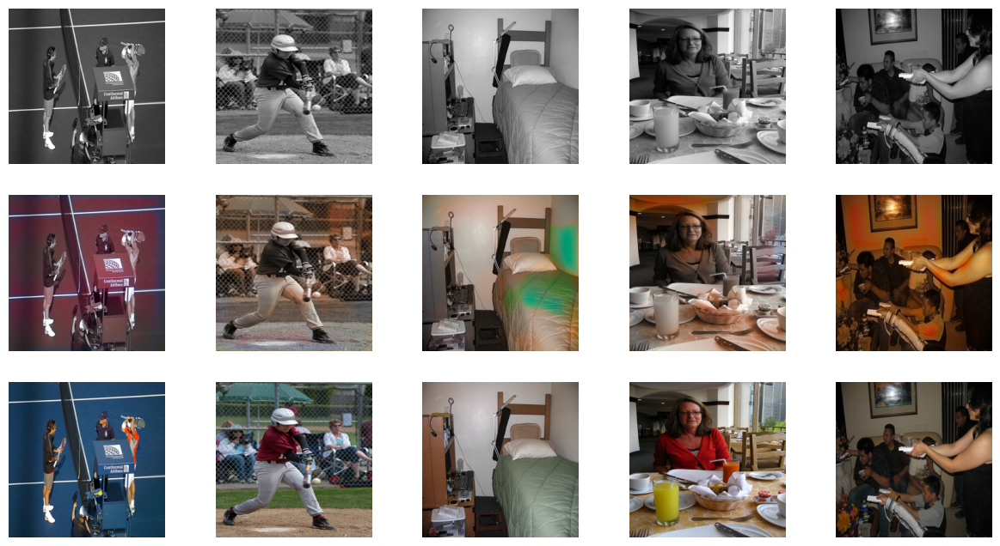

Epoch 4/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 4 Results:
loss_D_fake: 0.46399
loss_D_real: 0.49590
loss_D: 0.47994
loss_G_GAN: 0.65681
loss_G_L1: 1.08938
loss_G: 1.74620
Validation PSNR: 19.76, SSIM: 0.8530
Avg PSNR: 19.5316, Avg SSIM: 0.8597


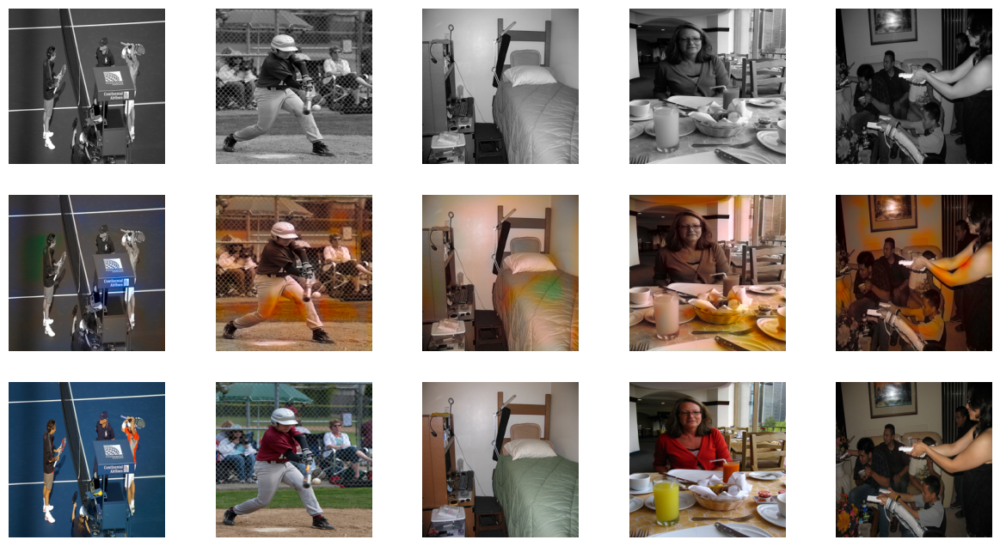

Epoch 5/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 5 Results:
loss_D_fake: 0.45060
loss_D_real: 0.48267
loss_D: 0.46663
loss_G_GAN: 0.61309
loss_G_L1: 1.08435
loss_G: 1.69744
Validation PSNR: 19.02, SSIM: 0.8005
Avg PSNR: 19.0239, Avg SSIM: 0.8160


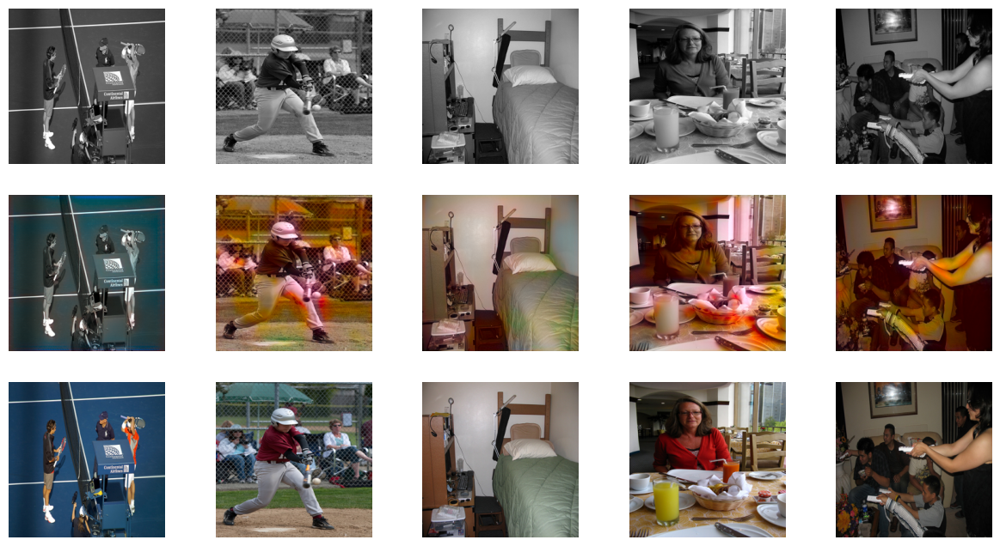

Epoch 6/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 6 Results:
loss_D_fake: 0.97806
loss_D_real: 1.00754
loss_D: 0.99280
loss_G_GAN: 1.31124
loss_G_L1: 1.06521
loss_G: 2.37645
Validation PSNR: 22.62, SSIM: 0.9039
Avg PSNR: 22.2703, Avg SSIM: 0.9072


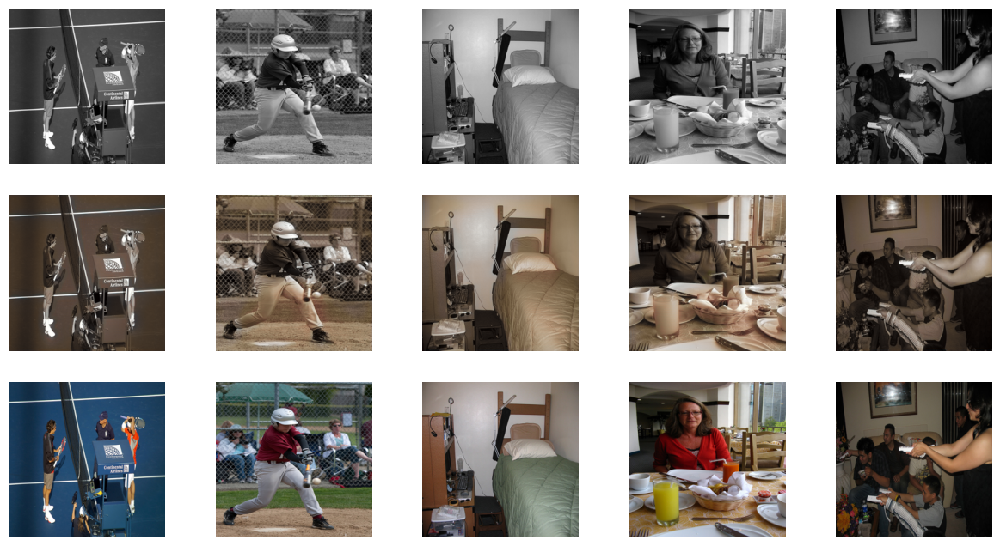

Epoch 7/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 7 Results:
loss_D_fake: 0.24112
loss_D_real: 0.24723
loss_D: 0.24417
loss_G_GAN: 0.35123
loss_G_L1: 0.96592
loss_G: 1.31715
Validation PSNR: 19.43, SSIM: 0.8522
Avg PSNR: 19.8569, Avg SSIM: 0.8653


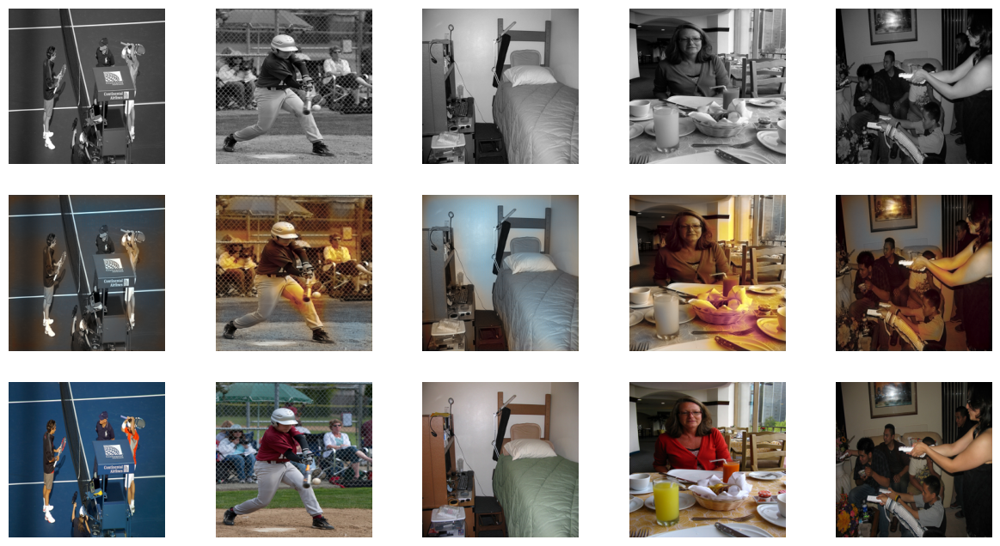

Epoch 8/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 8 Results:
loss_D_fake: 0.42803
loss_D_real: 0.43267
loss_D: 0.43035
loss_G_GAN: 0.54168
loss_G_L1: 1.14953
loss_G: 1.69121
Validation PSNR: 21.17, SSIM: 0.8706
Avg PSNR: 20.9174, Avg SSIM: 0.8723


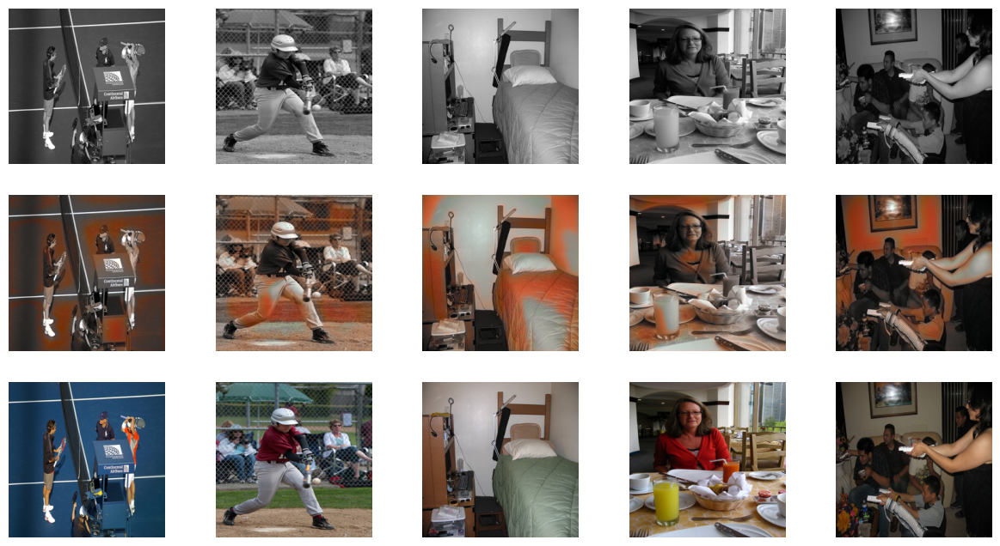

Epoch 9/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 9 Results:
loss_D_fake: 0.37231
loss_D_real: 0.38571
loss_D: 0.37901
loss_G_GAN: 0.51483
loss_G_L1: 1.11604
loss_G: 1.63087
Validation PSNR: 20.64, SSIM: 0.8696
Avg PSNR: 20.5210, Avg SSIM: 0.8757


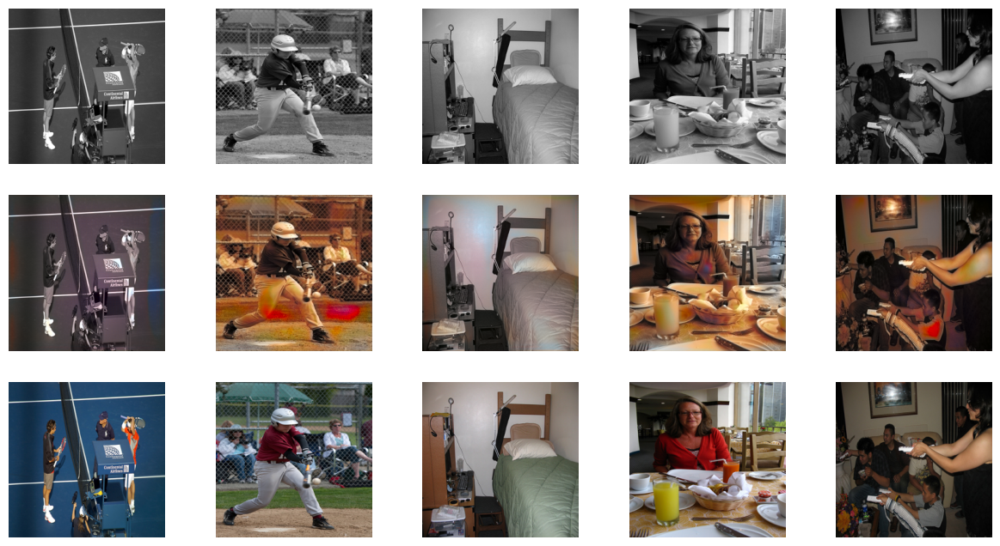

Epoch 10/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 10 Results:
loss_D_fake: 0.37500
loss_D_real: 0.38753
loss_D: 0.38126
loss_G_GAN: 0.49430
loss_G_L1: 1.10426
loss_G: 1.59857
Validation PSNR: 19.93, SSIM: 0.8643
Avg PSNR: 19.7926, Avg SSIM: 0.8677


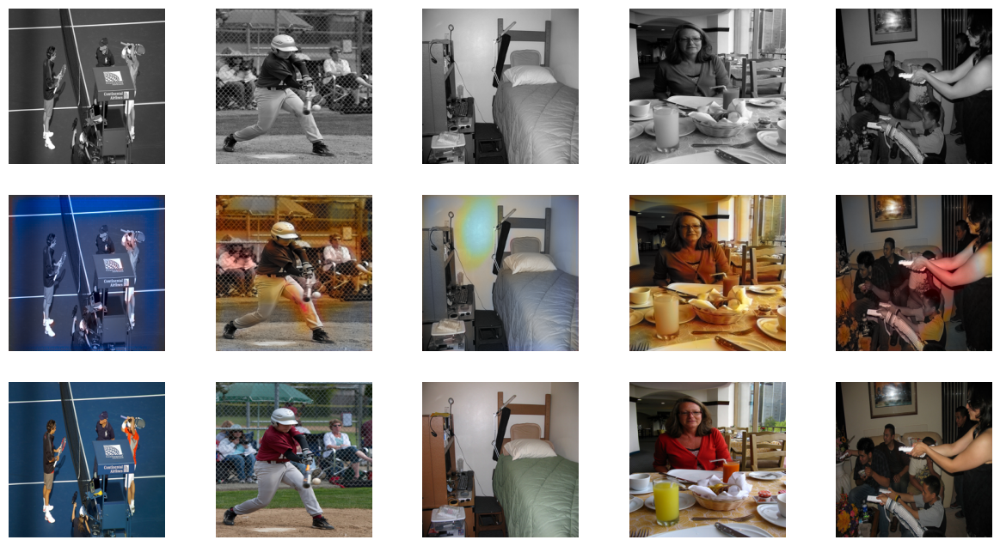

Epoch 11/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 11 Results:
loss_D_fake: 0.38243
loss_D_real: 0.39583
loss_D: 0.38913
loss_G_GAN: 0.51063
loss_G_L1: 1.11209
loss_G: 1.62272
Validation PSNR: 19.35, SSIM: 0.8341
Avg PSNR: 19.5700, Avg SSIM: 0.8507


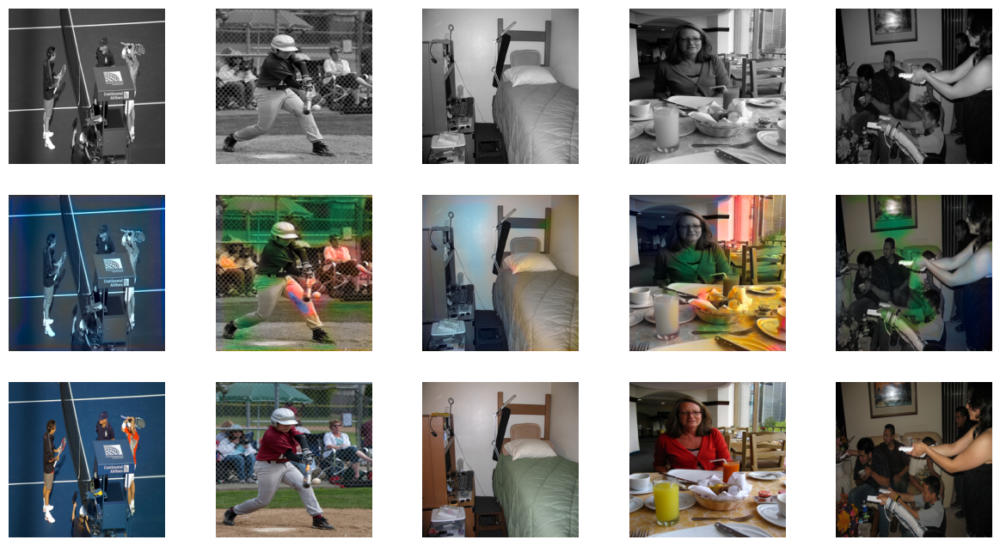

Epoch 12/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]

<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 74 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 2722 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 56 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 261 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 167 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserW


Epoch 12 Results:
loss_D_fake: 0.39368
loss_D_real: 0.41190
loss_D: 0.40279
loss_G_GAN: 0.58691
loss_G_L1: 1.14455
loss_G: 1.73146
Validation PSNR: 20.51, SSIM: 0.8415
Avg PSNR: 20.1281, Avg SSIM: 0.8460


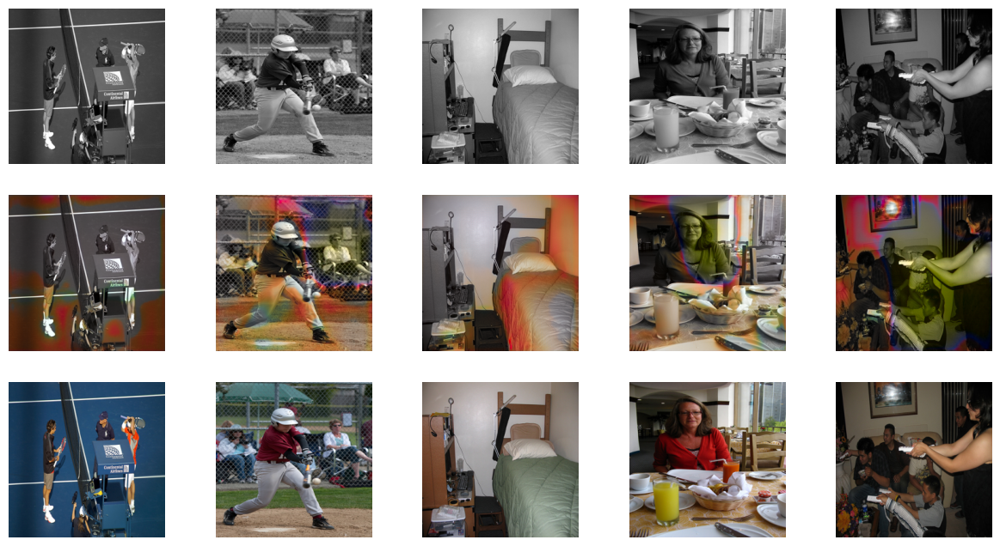

Epoch 13/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]

<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 135 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 62 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 19 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 49 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 84 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)
<ipython-input-16-563d5ff6cf90>:43: UserWarn


Epoch 13 Results:
loss_D_fake: 0.34972
loss_D_real: 0.36634
loss_D: 0.35803
loss_G_GAN: 0.52437
loss_G_L1: 1.15439
loss_G: 1.67877
Validation PSNR: 19.26, SSIM: 0.8389
Avg PSNR: 19.1547, Avg SSIM: 0.8444


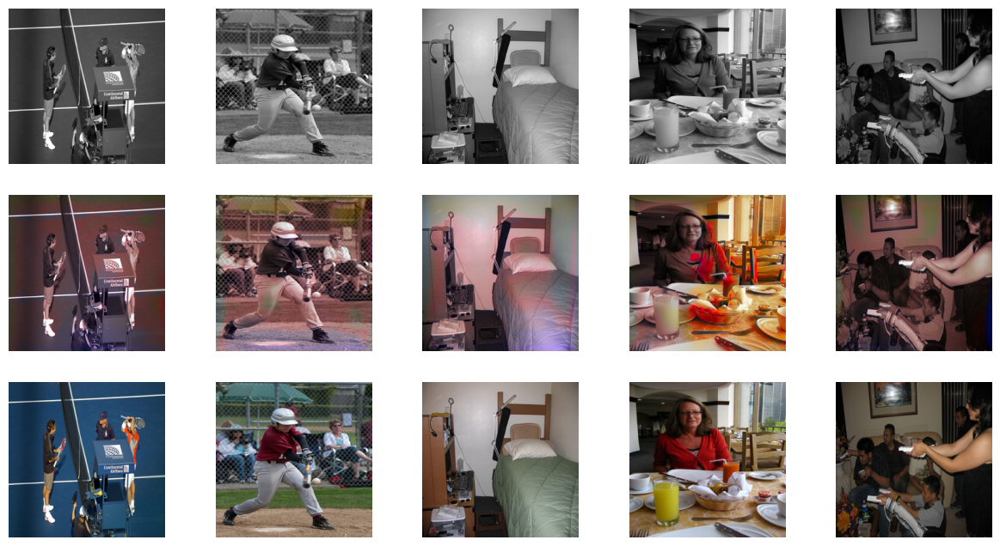

Epoch 14/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]


Epoch 14 Results:
loss_D_fake: 1.06584
loss_D_real: 1.14823
loss_D: 1.10703
loss_G_GAN: 1.37620
loss_G_L1: 1.30688
loss_G: 2.68308
Validation PSNR: 22.55, SSIM: 0.8838
Avg PSNR: 22.1898, Avg SSIM: 0.8907


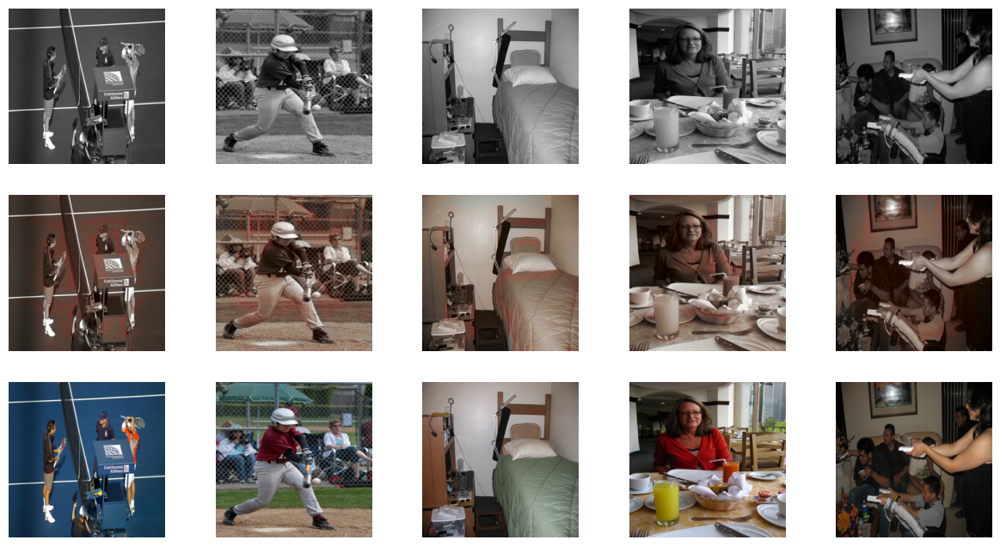

Epoch 15/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]

<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 232 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)



Epoch 15 Results:
loss_D_fake: 0.22680
loss_D_real: 0.23378
loss_D: 0.23029
loss_G_GAN: 0.35862
loss_G_L1: 1.00713
loss_G: 1.36575
Validation PSNR: 18.24, SSIM: 0.8028
Avg PSNR: 17.8827, Avg SSIM: 0.8011


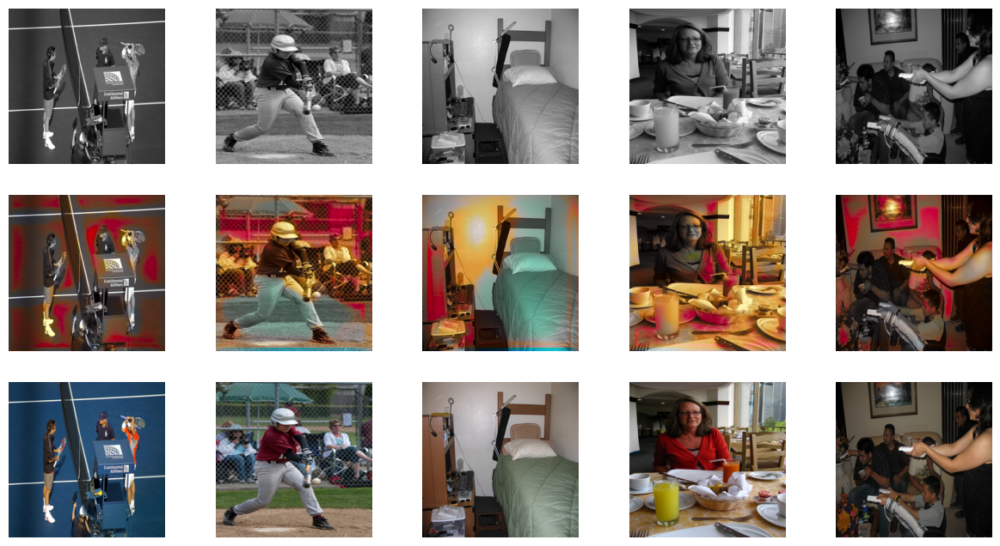

Epoch 16/25:   0%|          | 0/500 [00:00<?, ?it/s]

Validation:   0%|          | 0/4 [00:00<?, ?it/s]

<ipython-input-16-563d5ff6cf90>:43: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 9 negative Z values that have been clipped to zero
  img_rgb = lab2rgb(img)



Epoch 16 Results:
loss_D_fake: 0.26931
loss_D_real: 0.27939
loss_D: 0.27435
loss_G_GAN: 0.41278
loss_G_L1: 1.11447
loss_G: 1.52726
Validation PSNR: 17.23, SSIM: 0.7883
Avg PSNR: 17.0994, Avg SSIM: 0.7871


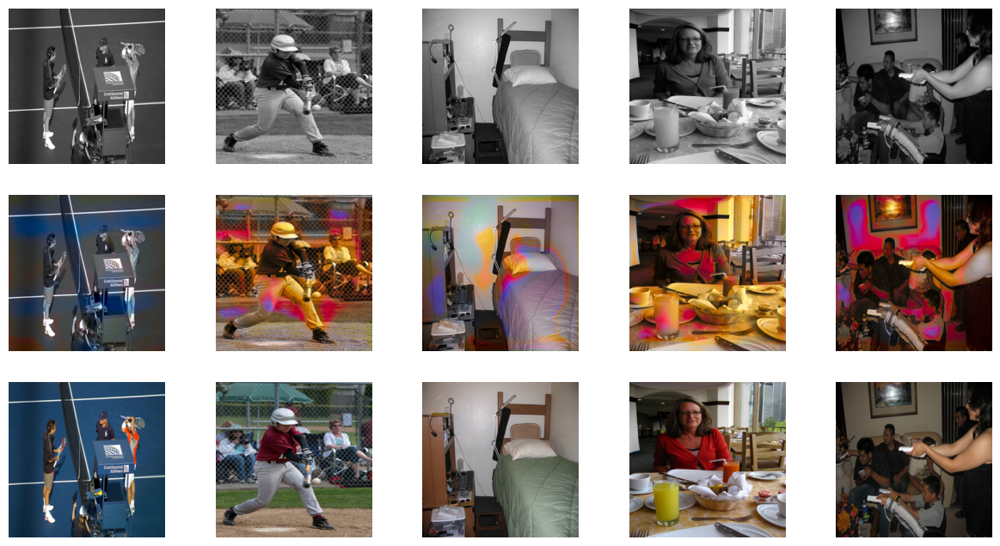

Epoch 17/25:   0%|          | 0/500 [00:00<?, ?it/s]

In [ ]:
# Initialize main model with pretrained generator
model = MainModel(net_G=net_G)

# Train the enhanced model
train_model(model, train_dl, fixed_val_dl, epochs=25)

In [ ]:
# Define the path to save the model
save_path = "/content/drive/MyDrive/saved_model/"

# Ensure the directory exists
os.makedirs(save_path, exist_ok=True)

# Save the model
model_file = os.path.join(save_path, "final_model_with_pretrainGen.pth")
torch.save(model, model_file)


print(f"Model saved at {model_file}")